# Stars Orbits in the Galaxy

In [2]:
#Import modules
from astroquery.gaia import Gaia
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import math
import scipy.integrate as integrate
import pandas as pd
from astropy import units as u
from astropy import constants as const
from astropy.coordinates import SkyCoord
import astropy.coordinates as coord
import pandas as pd
from decimal import Decimal
import imageio
#from astropy.table import QTable
#from astropy.io import ascii
#from __future__ import print_function
from tqdm import tqdm

In [3]:
#Parameter disk modelling
param=pd.read_excel("parameter fisgal.xlsx")
param

,Unnamed: 0,Thin,Thick,HI,HII
0,M1,2.106,0.056,2.046,0.928
1,M2,2.162,3.766,2.169,0.163
2,M3,-1.704,-3.250,-3.049,-0.837
3,a1,3.859,0.993,9.021,6.062
4,a2,9.052,6.555,9.143,3.141
5,a3,3.107,7.651,7.758,4.485
6,b,0.243,0.776,0.168,0.128
7,model,3.000,1.000,2.000,3.000


In [4]:
# Defining potential of each Galactic component
# x, y, z must be in kpc

def pot_disk(x, y, z):                                                          # Potential of disk component  
    param = pd.read_excel('parameter fisgal.xlsx')                             # Eq (14 - 17) (Barros, et al. 2016)
    R = (x**2 + y**2)**0.5                                                      # This is madness, need a tidier code 
    G = const.G                                                                 # But it works for now
    M_thin = np.array(param.Thin[0:3]) * 1E10 * u.M_sun
    M_thick = np.array(param.Thick[0:3]) * 1E10 * u.M_sun
    M_HI = np.array(param.HI[0:3]) * 1E10 * u.M_sun
    M_HII = np.array(param.HII[0:3]) * 1E10 * u.M_sun
    a_thin = np.array(param.Thin[3:6]) * u.kpc
    a_thick = np.array(param.Thick[3:6]) * u.kpc
    a_HI = np.array(param.HI[3:6]) * u.kpc
    a_HII = np.array(param.HII[3:6]) * u.kpc

    def model(R, z, M, a, b, n):                                                
        if str(int(n)) == '1':
            m1 = 0
            m2 = 0
        elif str(int(n)) == '2':
            m1 = 1
            m2 = 0
        elif str(int(n)) == '3':
            m1 = 1
            m2 = 1
        zeta = (z**2 + b**2)**0.5
        potential = (- G * M / (R**2 + (a + zeta)**2)**0.5) * ((m1 * (1 + (a*(a + zeta) / (R**2 + (a + zeta)**2)))) - (m2 * (a**2 * (R**2 - 2 * (a + zeta)**2) / (3 * ((R**2 + (a + zeta)**2))**2))))
        return potential
   
    thin_pot = 0
    thick_pot = 0
    HI_pot = 0
    HII_pot = 0

    for i in range(3):
        thin_pot += model(R, z, M_thin[i], a_thin[i], param['Thin'][6] * u.kpc, param['Thin'][7])
        thick_pot += model(R, z, M_thick[i], a_thick[i], param['Thick'][6] * u.kpc, param['Thick'][7])
        HI_pot += model(R, z, M_HI[i], a_HI[i], param['HI'][6] * u.kpc, param['HI'][7])
        HII_pot += model(R, z, M_HII[i], a_HII[i], param['HII'][6] * u.kpc, param['HII'][7])

    disk_pot = thin_pot + thick_pot + HI_pot + HII_pot  
    return disk_pot.to((u.km / u.s)**2)

def pot_bulge(x, y, z):                                                         # Potential of bulge component
    R = ((x**2 + y**2)**0.5).to(u.kpc)                                          # Eq (19) (Barros, et al. 2016)
    M_b = 2.61E10 * u.M_sun
    a_b = 0.44 * u.kpc
    bulge_pot = - const.G * M_b / ((R**2 + z**2)**0.5 + a_b)
    return bulge_pot.to((u.km / u.s)**2)

def pot_halo(x, y, z):                                                          # Potential of dark halo component
    R = ((x**2 + y**2)**0.5).to(u.kpc)                                          # Eq (20) (Barros, et al. 2016) 
    q_phi = 1                                                                   
    v_h = 166 * u.km / u.second                                                 
    r_h = 5.4 * u.kpc
    halo_pot = v_h.value**2 * np.log(R.value**2 + (z.value**2 * q_phi**-2) + r_h.value**2) / 2 
    return halo_pot * (u.km / u.s)**2

def totpot(x, y, z):
    total = pot_halo(x, y, z) + pot_bulge(x, y, z) + pot_disk(x, y, z)
    return total


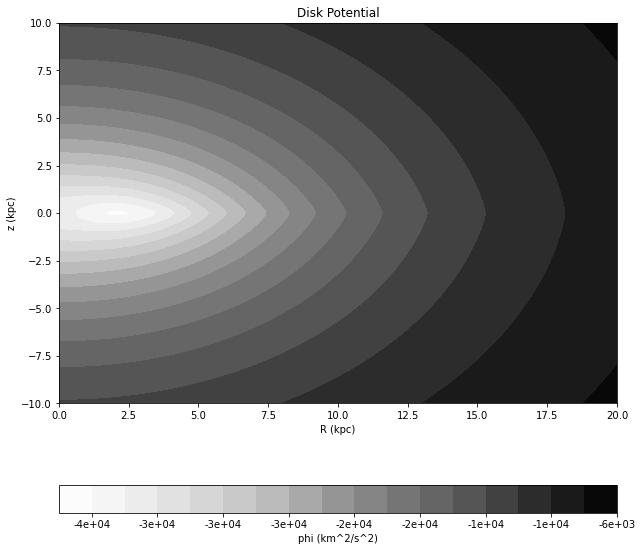

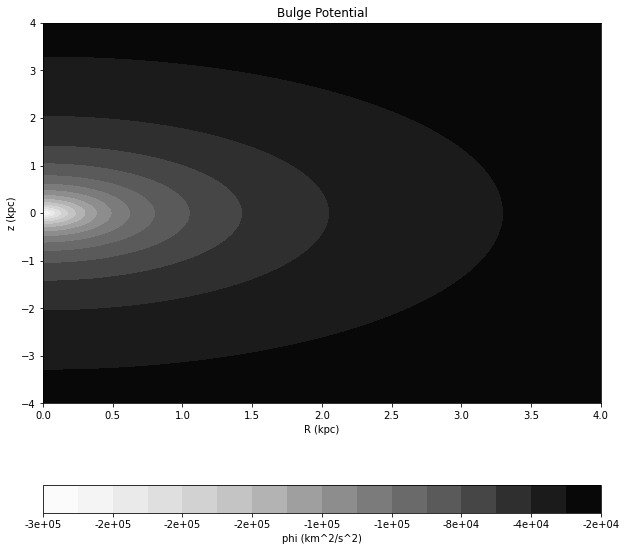

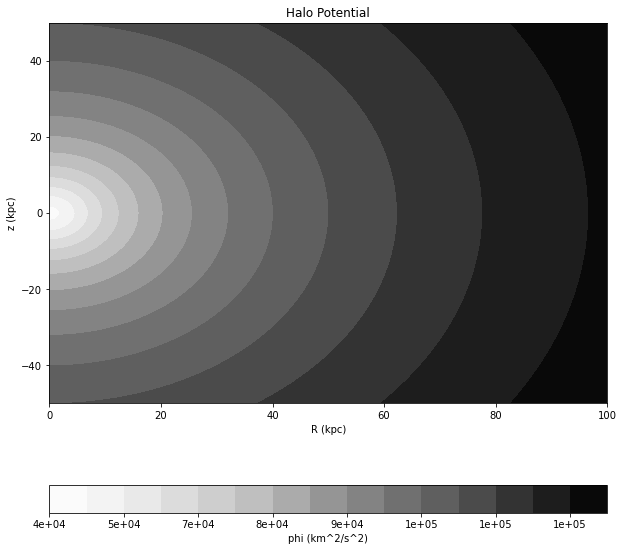

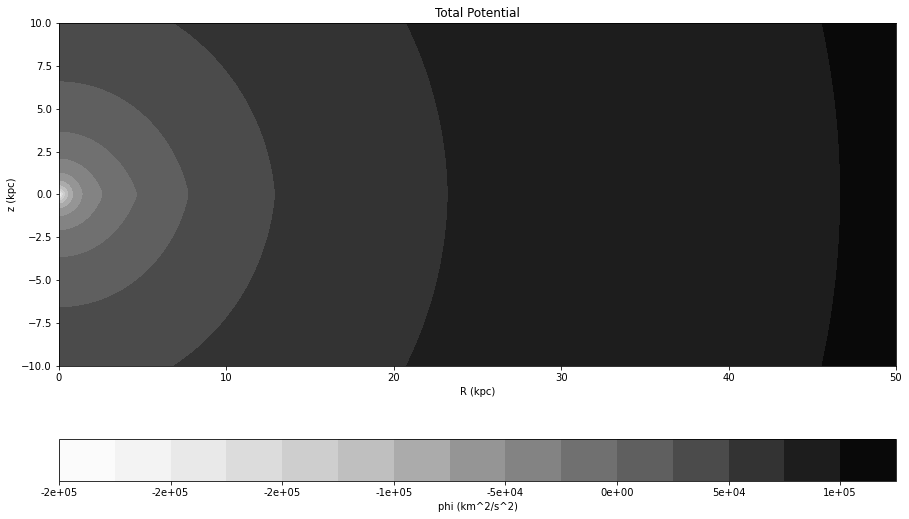

In [5]:
# Plot Kontur Potensial Gravitasi

# Disk Potential
x = np.linspace(0, 20, 1000) * u.kpc
y = 0
z = np.linspace(-10, 10, 1000) * u.kpc

X, Z = np.meshgrid(x, z)
disk = pot_disk(X, y, Z)
fig, ax = plt.subplots(1, 1, figsize = (10,10))
cp = ax.contourf(X, Z, disk, 15, cmap = 'Greys')
fig.colorbar(cp, label = 'phi (km^2/s^2)', orientation = 'horizontal', format = '%.0e') # Add a colorbar to a plot
ax.set_title('Disk Potential')
ax.set_xlabel('R (kpc)')
ax.set_ylabel('z (kpc)')
plt.show()


# Bulge Potential
x = np.linspace(0, 4, 1000) * u.kpc
y = 0
z = np.linspace(-4, 4, 1000) * u.kpc

X, Z = np.meshgrid(x, z)
bulge = pot_bulge(X, y, Z)
fig, ax = plt.subplots(1, 1, figsize = (10,10))
cp = ax.contourf(X, Z, bulge, 15, cmap = 'Greys')
fig.colorbar(cp, label='phi (km^2/s^2)', orientation = 'horizontal', format = '%.0e') # Add a colorbar to a plot
ax.set_title('Bulge Potential')
ax.set_xlabel('R (kpc)')
ax.set_ylabel('z (kpc)')
plt.show()


# Halo Potential
x = np.linspace(0, 100, 1000) * u.kpc
y = 0
z = np.linspace(-50, 50, 1000) * u.kpc

X, Z = np.meshgrid(x, z)
halo = pot_halo(X, y, Z)
fig, ax = plt.subplots(1, 1, figsize = (10,10))
cp = ax.contourf(X, Z, halo, 15, cmap = 'Greys')
fig.colorbar(cp, label = 'phi (km^2/s^2)', orientation = 'horizontal', format='%.0e') # Add a colorbar to a plot
ax.set_title('Halo Potential')
ax.set_xlabel('R (kpc)')
ax.set_ylabel('z (kpc)')
plt.show()


# Total Potential
x = np.linspace(0, 50, 1000) * u.kpc
y = 0
z = np.linspace(-10, 10, 1000) * u.kpc

X, Z = np.meshgrid(x, z)
total = totpot(X, y, Z)
fig, ax = plt.subplots(1, 1, figsize = (15,9))
cp = ax.contourf(X, Z, total, 15, cmap = 'Greys')
fig.colorbar(cp, label = 'phi (km^2/s^2)', orientation = 'horizontal', format = '%.0e') # Add a colorbar to a plot
ax.set_title('Total Potential')
ax.set_xlabel('R (kpc)')
ax.set_ylabel('z (kpc)')
plt.show()

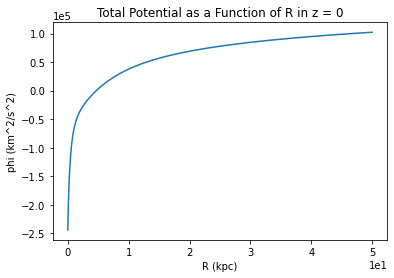

In [6]:
#Potensial total dalam fungsi R pada z = 0
X = np.linspace(0, 50, 1000) * u.kpc
Y = 0 * u.kpc
Z = 0 * u.kpc 

plt.plot(X, totpot(X, Y, Z))
plt.title('Total Potential as a Function of R in z = 0')
plt.xlabel('R (kpc)')
plt.ylabel('phi (km^2/s^2)')
plt.ticklabel_format(axis='both', style='sci', scilimits=(0,0))
plt.show()

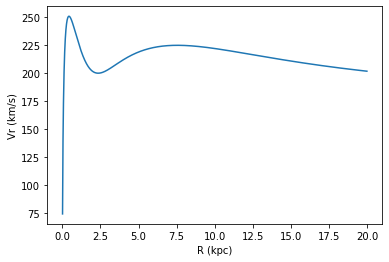

CPU times: total: 2.73 s
Wall time: 2min 48s


In [7]:
%%time
# Plot Kurva Rotasi

x = 0.01 * u.kpc
y = 0 * u.kpc
z = 0 * u.kpc
dx = 0.01 * u.kpc
Vrot = []
RADIUS = []

while x.value < 20:
    dpot = ((((totpot(x + dx/2, y, z)) - (totpot(x - dx/2, y, z))) / dx) + ((totpot(x + dx/2, y, z) - 2*totpot(x, y, z) + totpot(x - dx/2, y, z))/ dx)).decompose()
    Vc = np.sqrt(x * dpot)
    Vc = Vc.to(u.km / u.s) 
    Vrot.append(Vc.value)
    RADIUS.append(x.value)
    x += dx
    #print(x)

plt.plot(RADIUS, Vrot)
plt.xlabel('R (kpc)')
plt.ylabel('Vr (km/s)')
plt.show()

In [39]:
#Query Gaia
job=Gaia.launch_job_async("""SELECT 
    TOP 200000
    designation,source_id, ra,ra_error, dec,dec_error, parallax,parallax_error,parallax_over_error, l, b, pmra, pmra_error, pmdec, pmdec_error, radial_velocity, radial_velocity_error
    FROM gaiadr3.gaia_source
    WHERE radial_velocity IS NOT NULL AND random_index between 1111 and 1500000
    AND parallax_over_error between -20 and 20
    AND parallax between 0 and 10
    """)
r=job.get_results()

INFO: Query finished. [astroquery.utils.tap.core]


In [40]:
#Cek kolom hasil query
r.columns

<TableColumns names=('DESIGNATION','source_id','ra','ra_error','dec','dec_error','parallax','parallax_error','parallax_over_error','l','b','pmra','pmra_error','pmdec','pmdec_error','radial_velocity','radial_velocity_error')>

In [41]:
#Jarak dari paralaks
r["d"]= 1000/r["parallax"]
r[["parallax", "parallax_error", "d"]]

parallax,parallax_error,d
mas,mas,
float64,float32,float64
0.23556538729954943,0.024446482,4245.105834365984
0.35218469683967324,0.02439453,2839.419227960478
1.4120923166815293,0.4103938,708.1689973004301
0.1492438051502867,0.012630577,6700.445616439571
0.08479480448623672,0.016947612,11793.17537270002
0.2790691426827036,0.024785118,3583.3413554324106
0.06536985034524131,0.027117983,15297.572118012296
0.19153515267472332,0.020247318,5220.973727461199


In [42]:
# Transformasi koordinat dari ra, dec ke l, b
r['ra_1']=r['ra']*(np.pi/180)
r["dec_1"]=r['dec']*(np.pi/180)
c = coord.SkyCoord(ra=r["ra_1"] * u.degree,
                   dec=r["dec_1"] * u.degree,
                   distance=r["d"] * u.kpc,
                   frame='icrs')

In [43]:
c.galactic  

<SkyCoord (Galactic): (l, b, distance) in (deg, deg, kpc)
    [(104.31046008, -62.54042152, 4245.10583437),
     (104.30186661, -62.52906363, 2839.41922796),
     (104.60155395, -62.74836702,  708.1689973 ), ...,
     (104.97792335, -62.38358   , 2676.46751201),
     (104.94312627, -62.38195371, 1774.8758183 ),
     (104.92881   , -62.38867192, 3005.75487985)]>

In [44]:
#Transformasi koordinat dari l, b to x, y, z
c.transform_to(coord.Galactocentric) 

<SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
    (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z_sun=20.8 pc, roll=0.0 deg): (x, y, z) in kpc
    [(-501.61039082, 1896.78027761, -3765.5624623 ),
     (-338.13344438, 1269.2297909 , -2518.40126928),
     ( -91.47984872,  313.79788937,  -629.33258084), ...,
     (-334.83871503, 1198.52887438, -2370.68859822),
     (-224.31001556,  794.96596975, -1572.07207504),
     (-373.82031808, 1346.06405536, -2662.48528962)]>

In [45]:
#Hitung kecepatan pada x, y, and z
c1 = coord.SkyCoord(ra=r["ra"][0]*u.degree, dec=r["dec"][0]*u.degree,
                    distance=(r["parallax"][0]*u.mas).to(u.pc, u.parallax()),
                    pm_ra_cosdec=r["pmra"][0]*u.mas/u.yr,
                    pm_dec=r["pmdec"][0]*u.mas/u.yr,
                    radial_velocity=r["radial_velocity"][0]*u.km/u.s,
                    frame='icrs')
g1 = c1.transform_to(coord.Galactocentric)

g1#.v_x.value

<SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
    (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z_sun=20.8 pc, roll=0.0 deg): (x, y, z) in pc
    (-4280.67727087, -1780.83862119, -285.76428183)
 (v_x, v_y, v_z) in km / s
    (-16.06988157, 141.60929192, 83.33935469)>

In [46]:
#Koreksi terhadap kecepatan matahari
v_sun = [10.4, 14.8, 7.3] * (u.km / u.s)  # [vx, vy, vz]
gc_frame = coord.Galactocentric(
    galcen_distance=8*u.kpc,
    galcen_v_sun=v_sun,
    z_sun=0*u.pc)

In [47]:
U=[]
V=[]
W=[]

U_lsr=[]
V_lsr=[]
W_lsr=[]

X=[]
Y=[]
Z=[]
for i in tqdm(range (len(r))) :
  c1 = coord.SkyCoord(ra=r["ra"][i]*u.degree, dec=r["dec"][i]*u.degree,
                    distance=(r["parallax"][i]*u.mas).to(u.pc, u.parallax()),
                    pm_ra_cosdec=r["pmra"][i]*u.mas/u.yr,
                    pm_dec=r["pmdec"][i]*u.mas/u.yr,
                    radial_velocity=r["radial_velocity"][i]*u.km/u.s,
                    frame='icrs')
  g1 = c1.transform_to(coord.Galactocentric)
  X.append(g1.x)
  Y.append(g1.y)
  Z.append(g1.z)
  U.append(g1.v_x)
  V.append(g1.v_y)
  W.append(g1.v_z)
  g2 =g1.transform_to(gc_frame)
  U_lsr.append(g2.v_x)
  V_lsr.append(g2.v_y)
  W_lsr.append(g2.v_z)

100%|████████████████████████████████████████████████████████████████████████████| 10097/10097 [01:50<00:00, 91.37it/s]


In [48]:
r["X"]=X
r['Y']=Y
r['Z']=Z
r['U']=U
r["V"]=V
r['W']=W
r['U_lsr']=U_lsr
r["V_lsr"]=V_lsr
r['W_lsr']=W_lsr
r

DESIGNATION,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,l,b,pmra,pmra_error,pmdec,pmdec_error,radial_velocity,radial_velocity_error,d,ra_1,dec_1,X,Y,Z,U,V,W,U_lsr,V_lsr,W_lsr
,,deg,mas,deg,mas,mas,mas,,deg,deg,mas / yr,mas / yr,mas / yr,mas / yr,km / s,km / s,,,,pc,pc,pc,km / s,km / s,km / s,km / s,km / s,km / s
object,int64,float64,float32,float64,float32,float64,float32,float32,float64,float64,float64,float32,float64,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
Gaia DR3 5937082212752116864,5937082212752116864,251.59906720916288,0.0188143,-51.548366139903344,0.013558344,0.23556538729954943,0.024446482,9.6359625,335.1318275658143,-4.008185217651208,-6.32619794117753,0.02546606,-1.5812328188289069,0.018733362,11.95376,2.7479575,4245.105834365984,4.391232117746393,-0.8996887131648733,-4280.677270873983,-1780.838621185169,-285.7642818292199,-16.06988156782134,141.60929191855087,83.33935469161938,-18.76328996443585,-89.19070808144917,82.78491662522897
Gaia DR3 5937114785787018496,5937114785787018496,251.1963014510528,0.017797992,-50.98901424715178,0.013021268,0.35218469683967324,0.02439453,14.437036,335.39436590110756,-3.4534415410244277,-2.90395035483503,0.02418424,-7.3739449262701,0.017964793,55.94431,2.5833364,2839.419227960478,4.384202529153081,-0.8899261809590963,-5545.522281558173,-1180.1045370060606,-156.8362651536125,19.69747239293361,131.5990830736368,-30.51732021859856,17.295527455418032,-99.20091692636325,-30.979786676131695
Gaia DR3 5912401646962861696,5912401646962861696,262.3141902196085,0.29720396,-60.81701817510345,0.27090678,1.4120923166815293,0.4103938,3.4408226,331.0336610605836,-14.22956738941046,0.8639326052265663,0.35346887,-16.25259350249102,0.34011194,-15.959672,3.4763286,708.1689973004301,4.5782462940348765,-1.0614572084007885,-7521.850570097795,-332.4408548045383,-154.8104680423566,-29.229210319673452,216.96086328473888,-17.61561309400632,-31.664035385348093,-13.839136715261162,-18.203420430991795
Gaia DR3 2268487449553925120,2268487449553925120,280.64468227152366,0.0111755375,75.2545222110858,0.014099062,0.1492438051502867,0.012630577,11.8160715,106.38764400070139,26.725763918108942,0.8988711846609696,0.014540627,-0.019777067584531023,0.016117731,-88.25216,1.3649198,6700.445616439571,4.898173733851447,1.3134391895986504,-9802.721875384439,5741.502293603169,3038.4493036843937,29.418661052070412,181.69841413570978,-57.39456343412633,27.085515393788164,-49.10158586429026,-57.83204631996299
Gaia DR3 5912910445973310592,5912910445973310592,264.6206456728745,0.012905133,-58.82114781824569,0.0107204,0.08479480448623672,0.016947612,5.0033484,333.4146745114736,-14.235753720390633,-6.88404186687144,0.011661779,-12.000457400296717,0.012389971,275.7514,2.116464,11793.17537270002,4.6185015357449455,-1.0266226992306664,2092.9818161566736,-5115.734361647532,-2905.4498075777647,-92.75314758160123,-566.4469194876491,-52.71056442288443,-95.09788807741417,-797.2469194876492,-53.46093802192443
Gaia DR3 5937229336770706816,5937229336770706816,249.79966694150383,0.019818617,-51.36365229354042,0.014137203,0.2790691426827036,0.024785118,11.259544,334.5347274132871,-3.040692325810825,-7.0663710606458565,0.026662534,-3.675836679370521,0.020176776,-42.77752,2.759777,3583.3413554324106,4.359826658514475,-0.8964648483718173,-4891.820936712367,-1538.5408473768057,-177.5497246843658,-77.60053380836347,148.70549615999312,58.35776935026929,-80.22976395147309,-82.09450384000691,57.645836552271575
Gaia DR3 5912792901309011712,5912792901309011712,263.5261468911189,0.019897684,-59.25110345620664,0.016425725,0.06536985034524131,0.027117983,2.410572,332.7420120364147,-13.959506107330895,-2.5355686452111628,0.019555677,-6.397505643874373,0.019001713,61.802612,2.6694071,15297.572118012296,4.599398928344244,-1.0341268407505977,5065.73787409132,-6799.341062588363,-3703.30339076807,-175.81582105974604,-212.56314388767495,-77.8653654318219

In [49]:
r["X"]=X
r['Y']=Y
r['Z']=Z
r['U']=U
r["V"]=V
r['W']=W
r

DESIGNATION,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,l,b,pmra,pmra_error,pmdec,pmdec_error,radial_velocity,radial_velocity_error,d,ra_1,dec_1,X,Y,Z,U,V,W,U_lsr,V_lsr,W_lsr
,,deg,mas,deg,mas,mas,mas,,deg,deg,mas / yr,mas / yr,mas / yr,mas / yr,km / s,km / s,,,,pc,pc,pc,km / s,km / s,km / s,km / s,km / s,km / s
object,int64,float64,float32,float64,float32,float64,float32,float32,float64,float64,float64,float32,float64,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
Gaia DR3 5937082212752116864,5937082212752116864,251.59906720916288,0.0188143,-51.548366139903344,0.013558344,0.23556538729954943,0.024446482,9.6359625,335.1318275658143,-4.008185217651208,-6.32619794117753,0.02546606,-1.5812328188289069,0.018733362,11.95376,2.7479575,4245.105834365984,4.391232117746393,-0.8996887131648733,-4280.677270873983,-1780.838621185169,-285.7642818292199,-16.06988156782134,141.60929191855087,83.33935469161938,-18.76328996443585,-89.19070808144917,82.78491662522897
Gaia DR3 5937114785787018496,5937114785787018496,251.1963014510528,0.017797992,-50.98901424715178,0.013021268,0.35218469683967324,0.02439453,14.437036,335.39436590110756,-3.4534415410244277,-2.90395035483503,0.02418424,-7.3739449262701,0.017964793,55.94431,2.5833364,2839.419227960478,4.384202529153081,-0.8899261809590963,-5545.522281558173,-1180.1045370060606,-156.8362651536125,19.69747239293361,131.5990830736368,-30.51732021859856,17.295527455418032,-99.20091692636325,-30.979786676131695
Gaia DR3 5912401646962861696,5912401646962861696,262.3141902196085,0.29720396,-60.81701817510345,0.27090678,1.4120923166815293,0.4103938,3.4408226,331.0336610605836,-14.22956738941046,0.8639326052265663,0.35346887,-16.25259350249102,0.34011194,-15.959672,3.4763286,708.1689973004301,4.5782462940348765,-1.0614572084007885,-7521.850570097795,-332.4408548045383,-154.8104680423566,-29.229210319673452,216.96086328473888,-17.61561309400632,-31.664035385348093,-13.839136715261162,-18.203420430991795
Gaia DR3 2268487449553925120,2268487449553925120,280.64468227152366,0.0111755375,75.2545222110858,0.014099062,0.1492438051502867,0.012630577,11.8160715,106.38764400070139,26.725763918108942,0.8988711846609696,0.014540627,-0.019777067584531023,0.016117731,-88.25216,1.3649198,6700.445616439571,4.898173733851447,1.3134391895986504,-9802.721875384439,5741.502293603169,3038.4493036843937,29.418661052070412,181.69841413570978,-57.39456343412633,27.085515393788164,-49.10158586429026,-57.83204631996299
Gaia DR3 5912910445973310592,5912910445973310592,264.6206456728745,0.012905133,-58.82114781824569,0.0107204,0.08479480448623672,0.016947612,5.0033484,333.4146745114736,-14.235753720390633,-6.88404186687144,0.011661779,-12.000457400296717,0.012389971,275.7514,2.116464,11793.17537270002,4.6185015357449455,-1.0266226992306664,2092.9818161566736,-5115.734361647532,-2905.4498075777647,-92.75314758160123,-566.4469194876491,-52.71056442288443,-95.09788807741417,-797.2469194876492,-53.46093802192443
Gaia DR3 5937229336770706816,5937229336770706816,249.79966694150383,0.019818617,-51.36365229354042,0.014137203,0.2790691426827036,0.024785118,11.259544,334.5347274132871,-3.040692325810825,-7.0663710606458565,0.026662534,-3.675836679370521,0.020176776,-42.77752,2.759777,3583.3413554324106,4.359826658514475,-0.8964648483718173,-4891.820936712367,-1538.5408473768057,-177.5497246843658,-77.60053380836347,148.70549615999312,58.35776935026929,-80.22976395147309,-82.09450384000691,57.645836552271575
Gaia DR3 5912792901309011712,5912792901309011712,263.5261468911189,0.019897684,-59.25110345620664,0.016425725,0.06536985034524131,0.027117983,2.410572,332.7420120364147,-13.959506107330895,-2.5355686452111628,0.019555677,-6.397505643874373,0.019001713,61.802612,2.6694071,15297.572118012296,4.599398928344244,-1.0341268407505977,5065.73787409132,-6799.341062588363,-3703.30339076807,-175.81582105974604,-212.56314388767495,-77.8653654318219

In [50]:
# Error U, V, W (Johnson & Soderblom, 1987)
# ra & dec in degree, parallax in mas, rho in km/s, pmra & pmdec in mas/yr 

def galactocent_err(ra, dec, parallax, rho, pmra, pmdec, dparallax, drho, dpmra, dpmdec):
    k = 4.74057
    koef = 2*pmra*pmdec*k**2 * dparallax**2 / parallax**4
    T = [[-0.06699,-0.87276,-0.48354],
        [ 0.49273,-0.45035,0.74458],
        [-0.86760,-0.18837,0.46020]]
    A = [[np.cos(ra) * np.cos(dec),-np.sin(ra),-np.cos(ra) * np.sin(dec)],
        [np.sin(ra) * np.cos(dec),np.cos(ra),-np.sin(ra) * np.sin(dec)],
        [np.sin(dec),0,np.cos(dec)]]
    C = [[0,0,0],
        [0,0,0],
        [0,0,0]]

    # iterate through rows of T
    for i in range(len(T)):
        # iterate through columns of A
        for j in range(len(A[0])):
            # iterate through rows of A
            for k in range(len(A)):
                C[i][j] += (T[i][k] * A[k][j])**2
    
    E = [[drho**2],
        [(k/parallax)**2 * (dpmra**2 + (pmra*dparallax/parallax)**2)],
        [(k/parallax)**2 * (dpmdec**2 + (pmdec*dparallax/parallax)**2)]]
    
    result = [[0],
             [0],
             [0]]
    
    # iterate through rows of C
    for i in range(len(C)):
        # iterate through columns of E
        for j in range(len(E[0])):
            # iterate through rows of E
            for k in range(len(E)):
                result[i][j] += C[i][k] * E[k][j]
    
    dU = result[0][0] + koef*np.sqrt(C[0][1]*C[0][2])
    dV = result[1][0] + koef*np.sqrt(C[1][1]*C[1][2])
    dW = result[2][0] + koef*np.sqrt(C[2][1]*C[2][2])
    
    return np.sqrt(abs(dU)), np.sqrt(abs(dV)), np.sqrt(abs(dW))


# Assign the error of U, V, W into the dataframe

dU = []
dV = []
dW = []

for i in range(len(r)):
    du, dv, dw = galactocent_err(r['ra'][i] * np.pi/180, r['dec'][i] * np.pi/180, r['parallax'][i], r['radial_velocity'][i], r['pmra'][i]*np.cos(r['dec'][i] * np.pi/180), r['pmdec'][i], r['parallax'][i]/r['parallax_over_error'][i], r['radial_velocity_error'][i], r['pmra_error'][i], r['pmdec_error'][i])
    dU.append(du)
    dV.append(dv)
    dW.append(dw)

r['dU'] = dU
r['dV'] = dV
r['dW'] = dW
r

DESIGNATION,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,l,b,pmra,pmra_error,pmdec,pmdec_error,radial_velocity,radial_velocity_error,d,ra_1,dec_1,X,Y,Z,U,V,W,U_lsr,V_lsr,W_lsr,dU,dV,dW
,,deg,mas,deg,mas,mas,mas,,deg,deg,mas / yr,mas / yr,mas / yr,mas / yr,km / s,km / s,,,,pc,pc,pc,km / s,km / s,km / s,km / s,km / s,km / s,,,
object,int64,float64,float32,float64,float32,float64,float32,float32,float64,float64,float64,float32,float64,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
Gaia DR3 5937082212752116864,5937082212752116864,251.59906720916288,0.0188143,-51.548366139903344,0.013558344,0.23556538729954943,0.024446482,9.6359625,335.1318275658143,-4.008185217651208,-6.32619794117753,0.02546606,-1.5812328188289069,0.018733362,11.95376,2.7479575,4245.105834365984,4.391232117746393,-0.8996887131648733,-4280.677270873983,-1780.838621185169,-285.7642818292199,-16.06988156782134,141.60929191855087,83.33935469161938,-18.76328996443585,-89.19070808144917,82.78491662522897,4.003344279115234,4.712969095243572,5.196218247939911
Gaia DR3 5937114785787018496,5937114785787018496,251.1963014510528,0.017797992,-50.98901424715178,0.013021268,0.35218469683967324,0.02439453,14.437036,335.39436590110756,-3.4534415410244277,-2.90395035483503,0.02418424,-7.3739449262701,0.017964793,55.94431,2.5833364,2839.419227960478,4.384202529153081,-0.8899261809590963,-5545.522281558173,-1180.1045370060606,-156.8362651536125,19.69747239293361,131.5990830736368,-30.51732021859856,17.295527455418032,-99.20091692636325,-30.979786676131695,3.4423377057274105,3.540127534122544,3.2026222809239133
Gaia DR3 5912401646962861696,5912401646962861696,262.3141902196085,0.29720396,-60.81701817510345,0.27090678,1.4120923166815293,0.4103938,3.4408226,331.0336610605836,-14.22956738941046,0.8639326052265663,0.35346887,-16.25259350249102,0.34011194,-15.959672,3.4763286,708.1689973004301,4.5782462940348765,-1.0614572084007885,-7521.850570097795,-332.4408548045383,-154.8104680423566,-29.229210319673452,216.96086328473888,-17.61561309400632,-31.664035385348093,-13.839136715261162,-18.203420430991795,5.575024112162267,3.9030364497993055,1.7055383998545042
Gaia DR3 2268487449553925120,2268487449553925120,280.64468227152366,0.0111755375,75.2545222110858,0.014099062,0.1492438051502867,0.012630577,11.8160715,106.38764400070139,26.725763918108942,0.8988711846609696,0.014540627,-0.019777067584531023,0.016117731,-88.25216,1.3649198,6700.445616439571,4.898173733851447,1.3134391895986504,-9802.721875384439,5741.502293603169,3038.4493036843937,29.418661052070412,181.69841413570978,-57.39456343412633,27.085515393788164,-49.10158586429026,-57.83204631996299,0.7231840823486102,1.005681147181944,0.6644247481113518
Gaia DR3 5912910445973310592,5912910445973310592,264.6206456728745,0.012905133,-58.82114781824569,0.0107204,0.08479480448623672,0.016947612,5.0033484,333.4146745114736,-14.235753720390633,-6.88404186687144,0.011661779,-12.000457400296717,0.012389971,275.7514,2.116464,11793.17537270002,4.6185015357449455,-1.0266226992306664,2092.9818161566736,-5115.734361647532,-2905.4498075777647,-92.75314758160123,-566.4469194876491,-52.71056442288443,-95.09788807741417,-797.2469194876492,-53.46093802192443,53.46525702462155,62.363469657201364,56.72793643695829
Gaia DR3 5937229336770706816,5937229336770706816,249.79966694150383,0.019818617,-51.36365229354042,0.014137203,0.2790691426827036,0.024785118,11.259544,334.5347274132871,-3.040692325810825,-7.0663710606458565,0.026662534,-3.675836679370521,0.020176776,-42.77752,2.759777,3583.3413554324106,4.359826658514475,-0.8964648483718173,-4891.820936712367,-1538.5408473768057,-177.5497246843658,-77.60053380836347,148.70549615999312,58.35776935026929,-80.22976395147309,-82.09450384000691,57.645836552271575,4.761061538162297,5.29625716114127,5.598019967935637
Gaia DR3 5912792901309011712,5912792901309011712,263.5261468911189,0.01989

(-20.0, 20.0)

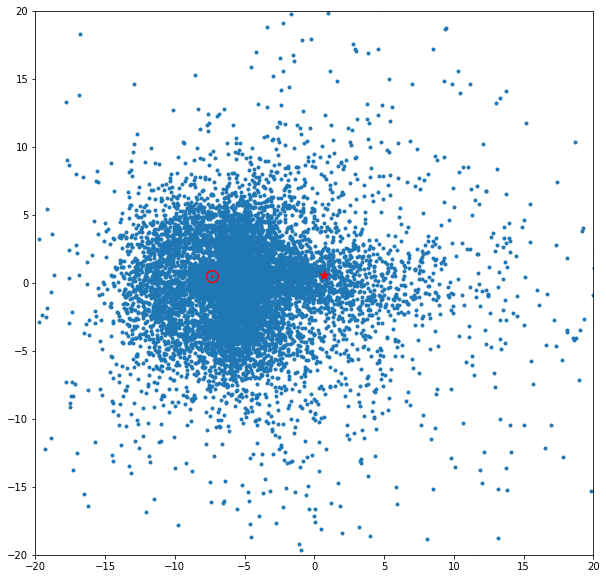

In [51]:
#sebaran bintang
plt.figure(figsize=(10,10))
plt.scatter(r['X']/1000,r['Y']/1000,marker=".")
plt.text(-8., 0, r'$\odot$', fontsize=20,color="red")
plt.text(0, 0, '$\star$', fontsize=30,color="red")
plt.xlim(-20,20)
plt.ylim(-20,20)

(-20.0, 20.0)

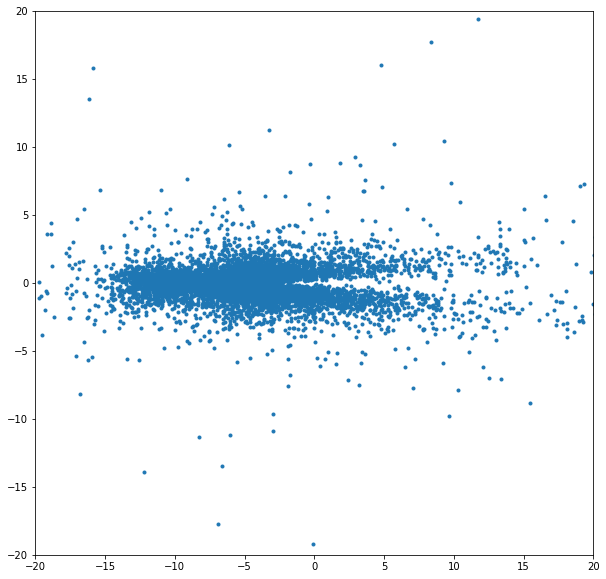

In [52]:
#sebaran bintang
plt.figure(figsize=(10,10))
plt.scatter(r['X']/1000,r['Z']/1000,marker=".")
plt.xlim(-20,20)
plt.ylim(-20,20)

(-20.0, 20.0)

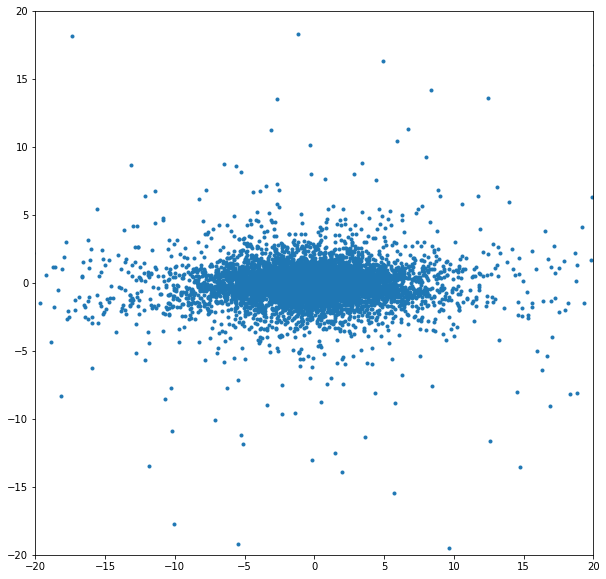

In [53]:
#sebaran bintang
plt.figure(figsize=(10,10))
plt.scatter(r['Y']/1000,r['Z']/1000,marker=".")
plt.xlim(-20,20)
plt.ylim(-20,20)

In [54]:
# anggota populasi thin disk (fD)
kD = 1/((2*np.pi)**(3/2))/(35*20*16)
s1d = (r['U_lsr']/35)**2
s2d = ((r['V_lsr']+15)/20)**2
s3d = (r['W_lsr']/16)**2
fD = 0.90*kD*np.exp(-(s1d/2)-(s2d/2)-(s3d/2))
#anggota populasi thick disk (fTD)
kTD = 1/((2*np.pi)**(3/2))/(67*38*35)
s1td = (r['U_lsr']/67)**2
s2td = ((r['V_lsr']+46)/38)**2
s3td = (r['W_lsr']/35)**2
fTD = 0.10*kTD*np.exp(-(s1td/2)-(s2td/2)-(s3td/2))
#anggota populasi halo (fH)
kH = 1/((2*np.pi)**(3/2))/(160*90*90)
s1h = (r['U_lsr']/160)**2
s2h = ((r['V_lsr']+220)/90)**2
s3h = (r['W_lsr']/90)**2
fH = 0.0015*kH*np.exp(-(s1h/2)-(s2h/2)-(s3h/2))
r['fD'] = fD.value
r['fTD'] = fTD.value
r['fH']= fH.value

In [55]:
fTD

2.1898102627869673e-09
1.7481659104037802e-08
3.890679163857077e-08
1.6711097857269583e-08
1.0940361328510323e-93
5.707765449061545e-09
2.9685173354415033e-34
5.783017869654013e-10
7.793697243269503e-09
4.1932610626945995e-12
8.780498584289205e-09


In [56]:
r['TD/D'] = fTD/fD
r['TD/H'] = fTD/fH

C:\Users\USER\AppData\Local\Temp\ipykernel_14872\2181826655.py:1: RuntimeWarning: divide by zero encountered in true_divide
  r['TD/D'] = fTD/fD
C:\Users\USER\AppData\Local\Temp\ipykernel_14872\2181826655.py:1: RuntimeWarning: invalid value encountered in true_divide
  r['TD/D'] = fTD/fD
C:\Users\USER\AppData\Local\Temp\ipykernel_14872\2181826655.py:2: RuntimeWarning: invalid value encountered in true_divide
  r['TD/H'] = fTD/fH


In [57]:
#bintang populasi thin disk
thin_p = r[r['TD/D']<0.1]
#bintang populasi thick disk
thick_p = r[(r['TD/D']>2) & (r['TD/H']>1)]
#bintang populasi halo
h_p=r[(r['TD/H']<0.5)]

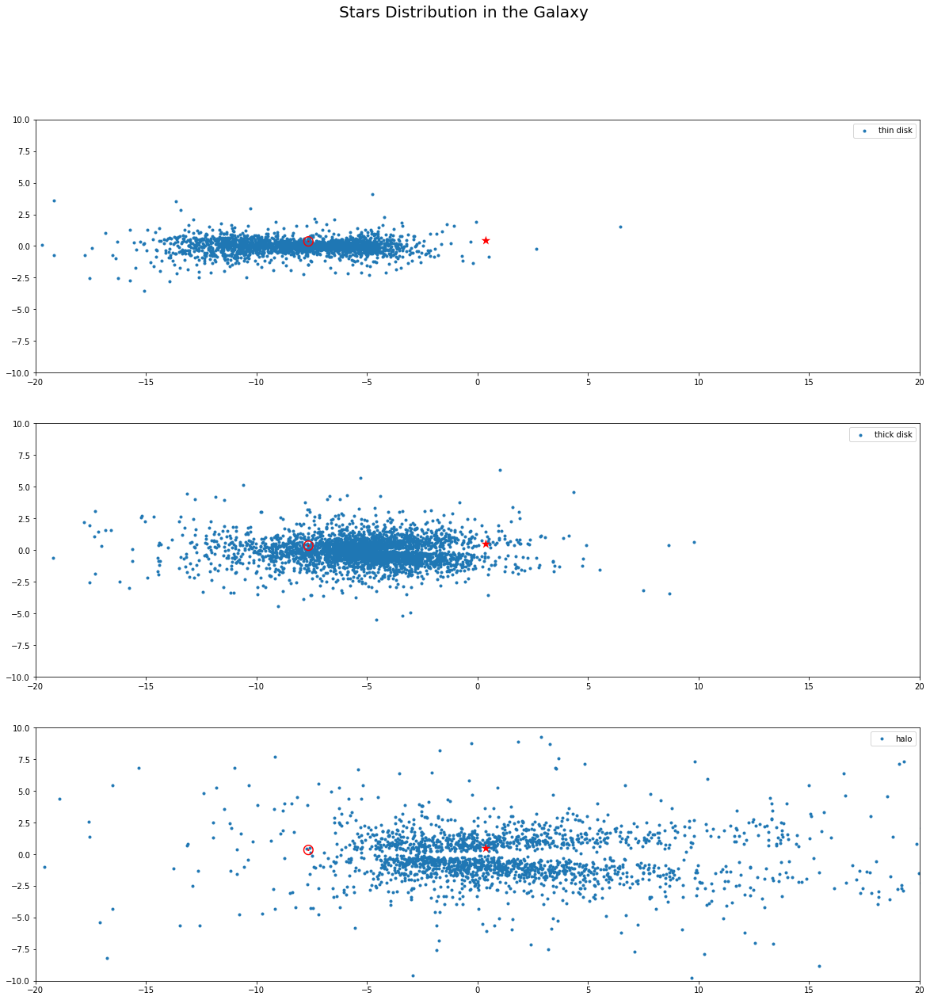

In [58]:
fig, ax = plt.subplots(3,1,figsize=(20,20))
plt
fig.suptitle('Stars Distribution in the Galaxy',size=20
             )
ax[0].scatter(thin_p['X']/1000,thin_p['Z']/1000,marker=".",label="thin disk")
ax[1].scatter(thick_p['X']/1000,thick_p['Z']/1000,marker=".",label="thick disk")
ax[2].scatter(h_p['X']/1000,h_p['Z']/1000,marker=".",label="halo")
ax[0].text(-8., 0, r'$\odot$', fontsize=20,color="red")
ax[0].text(0, 0, '$\star$', fontsize=30,color="red")
ax[1].text(-8., 0, r'$\odot$', fontsize=20,color="red")
ax[1].text(0, 0, '$\star$', fontsize=30,color="red")
ax[2].text(-8., 0, r'$\odot$', fontsize=20,color="red")
ax[2].text(0, 0, '$\star$', fontsize=30,color="red")
ax[0].set_xlim(-20,20)
ax[0].set_ylim(-10,10)
ax[1].set_xlim(-20,20)
ax[1].set_ylim(-10,10)
ax[2].set_xlim(-20,20)
ax[2].set_ylim(-10,10)
ax[0].legend()
ax[1].legend()
ax[2].legend()

In [28]:
# Bintang disk (Matahari)
x = -8.122 * u.kpc
y = 0 * u.kpc
z = 0.0208 * u.kpc
U = 12.9 * u.kilometer / (u.second)
V = 245.6 * u.kilometer / (u.second)
W = 7.78 * u.kilometer / (u.second)
Ax = 0 * u.kilometer / (u.s)**2
Ay = 0 * u.kilometer / (u.s)**2
Az = 0 * u.kilometer / (u.s)**2
X, Y, Z = [x.value], [y.value], [z.value]
R = [np.sqrt(x.value**2 + y.value**2)]

dt = 2.5E4 * u.yr                                            # Timestep of the simulation
t = 0 * u.yr                                                 # Set t0 = 0

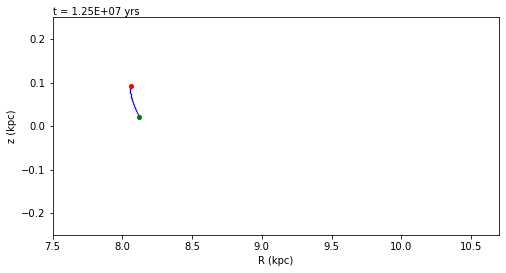

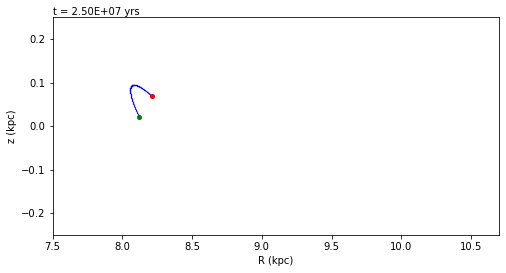

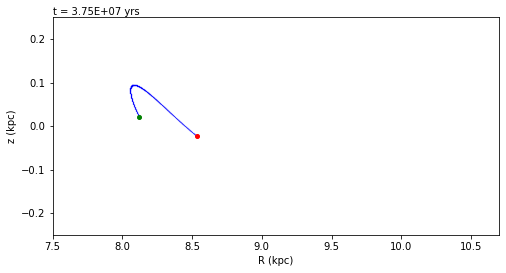

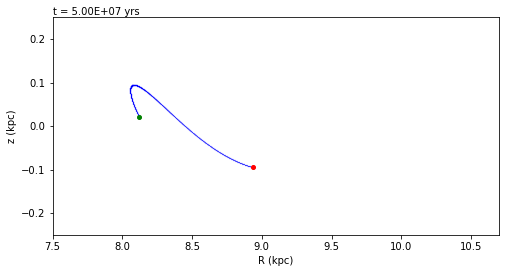

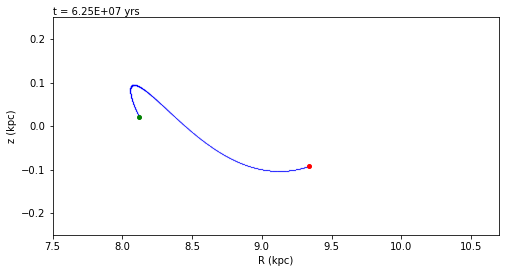

...

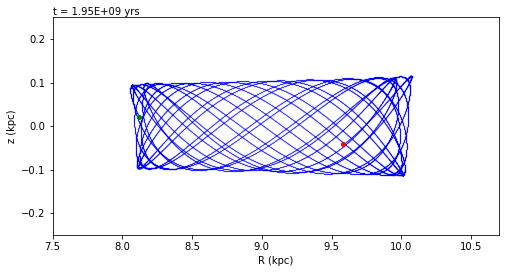

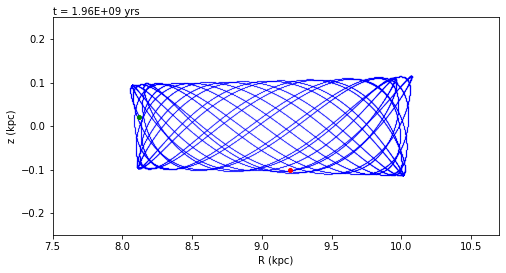

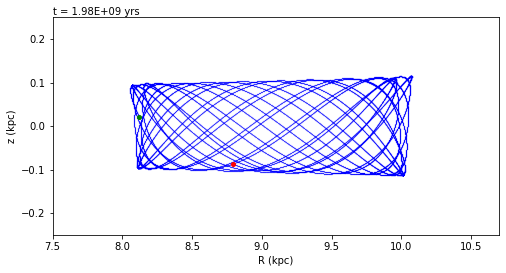

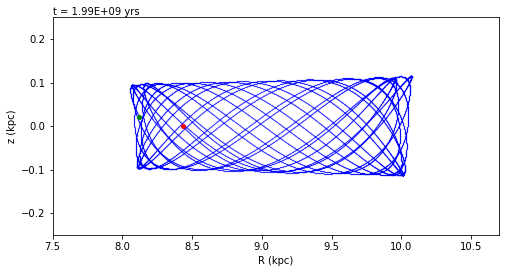

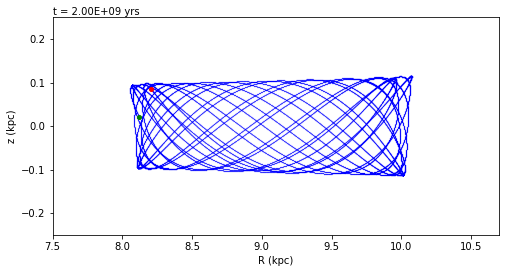

CPU times: total: 29min 37s
Wall time: 6h 7min 28s


In [33]:
%%time
# The simulation uses second order approximation of gradient
# This implies the simulation will result large error for large dt 
# Result also may deviates at large enough t
# Another note: at dt constant, typically error increase as U, V, W increase
#               choose smaller dt for larger U, V, W

# WARNING
# Long simulation ahead, this'll take quite some time

count = 0
while t.value <= 2E9:                                        # We do the simulation for 2 Gyr
    dx = (U*dt).decompose() + (0.5*Ax*dt**2).decompose()
    dy = (V*dt).decompose() + (0.5*Ay*dt**2).decompose()
    dz = (W*dt).decompose() + (0.5*Az*dt**2).decompose()
    Ax = -((((totpot(x + dx/2, y, z)) - (totpot(x - dx/2, y, z))) / dx) + ((totpot(x + dx/2, y, z) - 2*totpot(x, y, z) + totpot(x - dx/2, y, z))/ dx)).decompose()
    Ay = -((((totpot(x, y + dy/2, z)) - (totpot(x, y - dy/2, z))) / dy) + ((totpot(x, y + dy/2, z) - 2*totpot(x, y, z) + totpot(x, y - dy/2, z))/ dy)).decompose()
    Az = -((((totpot(x, y, z + dz/2)) - (totpot(x, y, z - dz/2))) / dz) + ((totpot(x, y, z + dz/2) - 2*totpot(x, y, z) + totpot(x, y, z - dz/2))/ dz)).decompose()
    U += (Ax*dt).decompose()
    V += (Ay*dt).decompose()
    W += (Az*dt).decompose()
    x += dx.decompose()
    y += dy.decompose()
    z += dz.decompose()
    X.append(x.value)
    Y.append(y.value)
    Z.append(z.value)
    R.append(np.sqrt(x.value**2 + y.value**2))
    t += dt
    count += 1

    if count%500 == 0:                                        # Plotting frequency
        fig, ax = plt.subplots(figsize=(8, 4))
        plt.plot(R, Z, 'bo', markersize=.1, alpha=.5)
        plt.plot(np.sqrt(x.value**2 + y.value**2), z.value, 'ro', markersize=4)
        plt.plot(R[0], Z[0], 'go', markersize=4)
        plt.text(7.5, 0.255, 't = ' + str('%.2E' % Decimal(t.value)) + ' yrs')
        plt.xlim(7.5, 10.7)
        plt.ylim(-0.25, 0.25)
        plt.xlabel('R (kpc)')
        plt.ylabel('z (kpc)')
        plt.show()

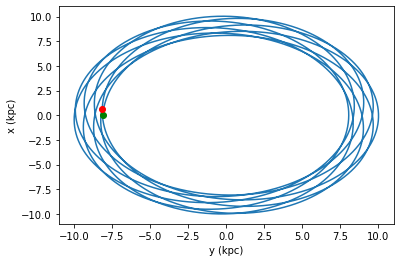

In [34]:
# Plot di bidang X-Y
plt.plot(X, Y)
plt.plot(X[0], Y[0], 'go')
plt.plot(X[len(X) - 1], Y[len(Y) - 1], 'ro')
plt.xlabel('y (kpc)')
plt.ylabel('x (kpc)')
plt.show()

In [59]:
r

DESIGNATION,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,l,b,pmra,pmra_error,pmdec,pmdec_error,radial_velocity,radial_velocity_error,d,ra_1,dec_1,X,Y,Z,U,V,W,U_lsr,V_lsr,W_lsr,dU,dV,dW,fD,fTD,fH,TD/D,TD/H
,,deg,mas,deg,mas,mas,mas,,deg,deg,mas / yr,mas / yr,mas / yr,mas / yr,km / s,km / s,,,,pc,pc,pc,km / s,km / s,km / s,km / s,km / s,km / s,,,,,,,km / s,km / s
object,int64,float64,float32,float64,float32,float64,float32,float32,float64,float64,float64,float32,float64,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
Gaia DR3 5937082212752116864,5937082212752116864,251.59906720916288,0.0188143,-51.548366139903344,0.013558344,0.23556538729954943,0.024446482,9.6359625,335.1318275658143,-4.008185217651208,-6.32619794117753,0.02546606,-1.5812328188289069,0.018733362,11.95376,2.7479575,4245.105834365984,4.391232117746393,-0.8996887131648733,-4280.677270873983,-1780.838621185169,-285.7642818292199,-16.06988156782134,141.60929191855087,83.33935469161938,-18.76328996443585,-89.19070808144917,82.78491662522897,4.003344279115234,4.712969095243572,5.196218247939911,6.9829534812283264e-15,2.1898102627869673e-09,1.6625891800306766e-11,313593.7062553325,131.71084529411908
Gaia DR3 5937114785787018496,5937114785787018496,251.1963014510528,0.017797992,-50.98901424715178,0.013021268,0.35218469683967324,0.02439453,14.437036,335.39436590110756,-3.4534415410244277,-2.90395035483503,0.02418424,-7.3739449262701,0.017964793,55.94431,2.5833364,2839.419227960478,4.384202529153081,-0.8899261809590963,-5545.522281558173,-1180.1045370060606,-156.8362651536125,19.69747239293361,131.5990830736368,-30.51732021859856,17.295527455418032,-99.20091692636325,-30.979786676131695,3.4423377057274105,3.540127534122544,3.2026222809239133,9.813368531500426e-11,1.7481659104037802e-08,2.7973831342365e-11,178.14126767911083,624.9290234892738
Gaia DR3 5912401646962861696,5912401646962861696,262.3141902196085,0.29720396,-60.81701817510345,0.27090678,1.4120923166815293,0.4103938,3.4408226,331.0336610605836,-14.22956738941046,0.8639326052265663,0.35346887,-16.25259350249102,0.34011194,-15.959672,3.4763286,708.1689973004301,4.5782462940348765,-1.0614572084007885,-7521.850570097795,-332.4408548045383,-154.8104680423566,-29.229210319673452,216.96086328473888,-17.61561309400632,-31.664035385348093,-13.839136715261162,-18.203420430991795,5.575024112162267,3.9030364497993055,1.7055383998545042,1.77101977788049e-06,3.890679163857077e-08,5.121700331590327e-12,0.02196858111044553,7596.459987827892
Gaia DR3 2268487449553925120,2268487449553925120,280.64468227152366,0.0111755375,75.2545222110858,0.014099062,0.1492438051502867,0.012630577,11.8160715,106.38764400070139,26.725763918108942,0.8988711846609696,0.014540627,-0.019777067584531023,0.016117731,-88.25216,1.3649198,6700.445616439571,4.898173733851447,1.3134391895986504,-9802.721875384439,5741.502293603169,3038.4493036843937,29.418661052070412,181.69841413570978,-57.39456343412633,27.085515393788164,-49.10158586429026,-57.83204631996299,0.7231840823486102,1.005681147181944,0.6644247481113518,1.2866198948535629e-09,1.6711097857269583e-08,9.713183592197099e-12,12.98837203133064,1720.455265634444
Gaia DR3 5912910445973310592,5912910445973310592,264.6206456728745,0.012905133,-58.82114781824569,0.0107204,0.08479480448623672,0.016947612,5.0033484,333.4146745114736,-14.235753720390633,-6.88404186687144,0.011661779,-12.000457400296717,0.012389971,275.7514,2.116464,11793.17537270002,4.6185015357449455,-1.0266226992306664,2092.9818161566736,-5115.734361647532,-2905.4498075777647,-92.75314758160123,-566.4469194876491,-52.71056442288443,-95.09788807741417,-797.2469194876492,-53.46093802192443,53.46525702462155,62.363469657201364,56.72793643695829,0.0,1.0940361328510323e-93,6.025376466639274e-20,inf,1.8157141531460925e-74
Gaia DR3 5937229336770706816,5937229336770706816,249.79966

In [30]:
#Bintang halo
h_p

DESIGNATION,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,l,b,pmra,pmra_error,pmdec,pmdec_error,radial_velocity,radial_velocity_error,d,ra_1,dec_1,X,Y,Z,U,V,W,U_lsr,V_lsr,W_lsr,dU,dV,dW,fD,fTD,fH,TD/D,TD/H
,deg,mas,deg,mas,mas,mas,,deg,deg,mas / yr,mas / yr,mas / yr,mas / yr,km / s,km / s,,,,pc,pc,pc,km / s,km / s,km / s,km / s,km / s,km / s,,,,,,,km / s,km / s
object,float64,float32,float64,float32,float64,float32,float32,float64,float64,float64,float32,float64,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
Gaia DR3 5912910445973310592,264.6206456728745,0.012905133,-58.82114781824569,0.0107204,0.08479480448623672,0.016947612,5.0033484,333.4146745114736,-14.235753720390633,-6.88404186687144,0.011661779,-12.000457400296717,0.012389971,275.7514,2.116464,11793.17537270002,4.6185015357449455,-1.0266226992306664,2092.9818161566736,-5115.734361647532,-2905.4498075777647,-92.75314758160123,-566.4469194876491,-52.71056442288443,-95.09788807741417,-797.2469194876492,-53.46093802192443,53.46525702462155,62.363469657201364,56.72793643695829,0.0,1.0940361328510323e-93,6.025376466639274e-20,inf,1.8157141531460925e-74
Gaia DR3 5912792901309011712,263.5261468911189,0.019897684,-59.25110345620664,0.016425725,0.06536985034524131,0.027117983,2.410572,332.7420120364147,-13.959506107330895,-2.5355686452111628,0.019555677,-6.397505643874373,0.019001713,61.802612,2.6694071,15297.572118012296,4.599398928344244,-1.0341268407505977,5065.73787409132,-6799.341062588363,-3703.30339076807,-175.81582105974604,-212.56314388767495,-77.86536543182196,-178.09586909778102,-443.363143887675,-78.82837552907071,73.97576127975223,77.64416761170565,68.05731423290872,1.588149309064625e-116,2.9685173354415033e-34,1.2390627763423568e-12,1.869167664839949e+82,2.3957763820525694e-22
Gaia DR3 5902670213167640576,229.76839737644727,0.016904136,-48.23449238161172,0.015164198,0.10508116339273602,0.024439719,4.2996063,326.7383249597722,7.694724964513901,-8.405200876761716,0.02544709,-0.4347822401053145,0.021918299,-44.669228,2.823691,9516.45345096291,4.0102150512497055,-0.8418507050872458,-232.9794644306612,-5172.438762399762,1274.8090719928653,-225.62831663828393,7.844678566409535,188.70450422461488,-228.59087225929585,-222.95532143359048,187.61305289400724,19.512692162968975,17.26877176734874,21.746572434670224,1.2939726709538475e-68,2.381525039712162e-21,3.01392929299763e-12,1.8404755318028695e+47,7.901728302801411e-10
Gaia DR3 4126125225291056128,255.03317139744496,0.021487199,-21.805458918296907,0.013048038,0.08980820026100339,0.0236994,3.7894716,0.1785136082674179,12.494001858595638,-6.4352952485095445,0.027959183,-3.7164574963162624,0.01926704,-57.18993,3.4088387,11134.840661473772,4.451168542688443,-0.3805770530326422,2755.256694164572,33.85814084476306,2401.849432141188,-75.585042865832,-113.81165882509003,149.66719334502284,-78.44811808397611,-344.6116588250901,148.96012268536208,36.39434271305833,59.54024266164415,64.4215336727081,6.547470554419368e-85,1.6318034500401313e-25,6.351579796214499e-12,2.4922654275072794e+59,2.569130047004488e-14
Gaia DR3 5902635234952919424,229.41556966531132,0.016261697,-48.58771270035186,0.0147440415,0.05240863081209193,0.02160732,2.4255035,326.34763674082217,7.522526614995877,-5.6713546432146025,0.024810676,-4.38955520096602,0.021269761,-47.847637,1.46229,19080.82665974315,4.004057045998108,-0.848015562634205,7630.830165650369,-10482.702296775851,2478.45731250424,-377.9516707365681,-270.1235410075173,-58.19308699671689,-380.28143555987157,-500.9235410075173,-59.673820514593075,135.14034212776875,125.32788991748897,138.77469881894393,7.406037702330672e-163,1.2717219591439357e-46,2.6818434889023206e-14,1.717142161919762e+116,4.741969337160879e-33
Gaia DR3 4126066096496043520,255.60192361810124,0.019804642,-21.87044677606461,0.013103673,0.13015553372312633,0.023075154,5.640506,0

In [41]:
#Bintang bulge (Gaia DR3 6761837017231511040)
x = -0.0092 * u.kpc
y = 1.108 * u.kpc
z = -1.99 * u.kpc
U = 70.42666782511974 * u.kilometer / (u.second)
V = -221.57591644188173 * u.kilometer / (u.second)
W = -72.8233102830261 * u.kilometer / (u.second)
Ax = 0 * u.kilometer / (u.s)**2
Ay = 0 * u.kilometer / (u.s)**2
Az = 0 * u.kilometer / (u.s)**2
X, Y, Z = [x.value], [y.value], [z.value]
R = [np.sqrt(x.value**2 + y.value**2)]

dt = 2.5E4 * u.yr                                            # Timestep of the simulation
t = 0 * u.yr                                                 # Set t0 = 0

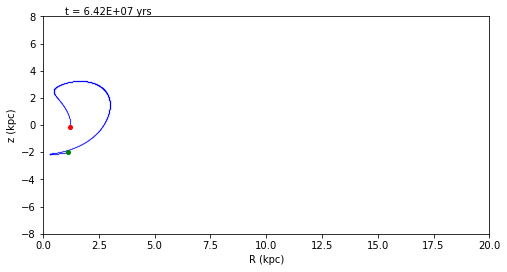

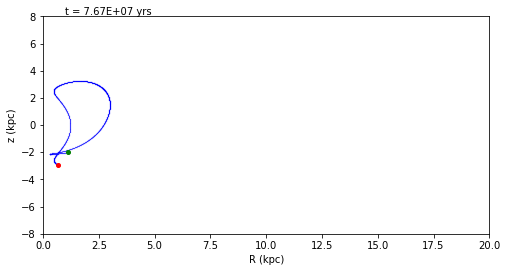

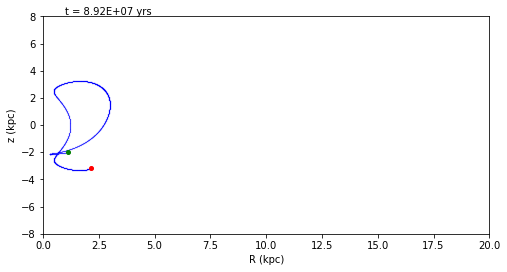

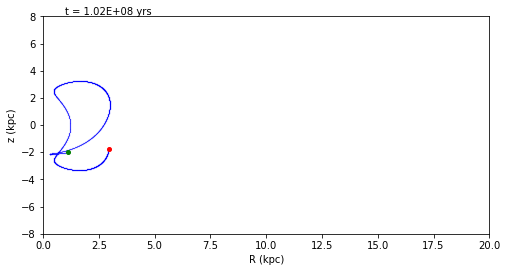

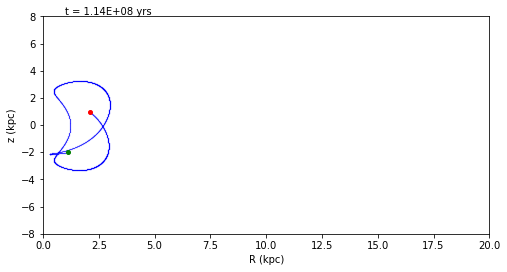

...

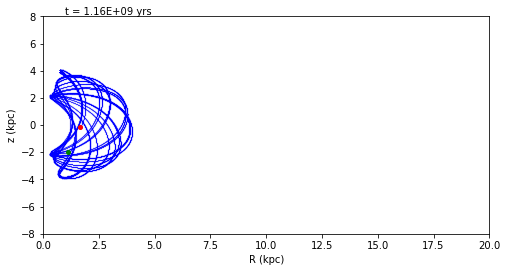

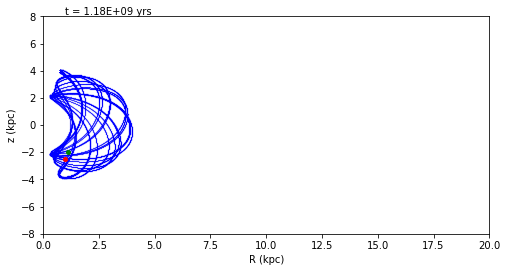

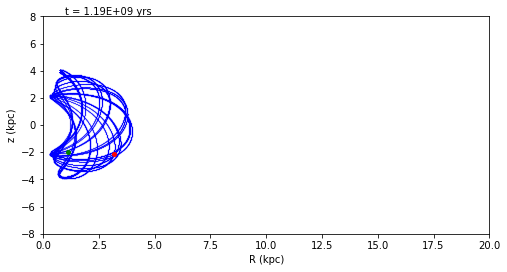

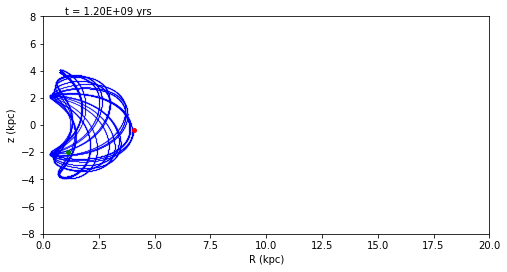

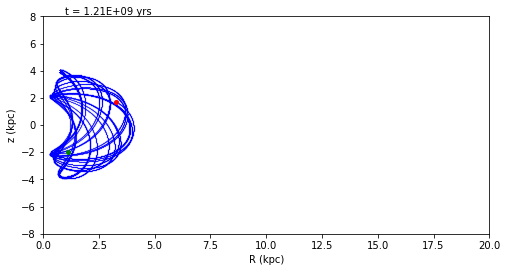

KeyboardInterrupt: 

In [43]:
%%time
# The simulation uses second order approximation of gradient
# This implies the simulation will result large error for large dt 
# Result also may deviates at large enough t
# Another note: at dt constant, typically error increase as U, V, W increase
#               choose smaller dt for larger U, V, W

# WARNING
# Long simulation ahead, this'll take quite some time

count = 0
while t.value <= 2E9:                                        # We do the simulation for 2 Gyr
    dx = (U*dt).decompose() + (0.5*Ax*dt**2).decompose()
    dy = (V*dt).decompose() + (0.5*Ay*dt**2).decompose()
    dz = (W*dt).decompose() + (0.5*Az*dt**2).decompose()
    Ax = -((((totpot(x + dx/2, y, z)) - (totpot(x - dx/2, y, z))) / dx) + ((totpot(x + dx/2, y, z) - 2*totpot(x, y, z) + totpot(x - dx/2, y, z))/ dx)).decompose()
    Ay = -((((totpot(x, y + dy/2, z)) - (totpot(x, y - dy/2, z))) / dy) + ((totpot(x, y + dy/2, z) - 2*totpot(x, y, z) + totpot(x, y - dy/2, z))/ dy)).decompose()
    Az = -((((totpot(x, y, z + dz/2)) - (totpot(x, y, z - dz/2))) / dz) + ((totpot(x, y, z + dz/2) - 2*totpot(x, y, z) + totpot(x, y, z - dz/2))/ dz)).decompose()
    U += (Ax*dt).decompose()
    V += (Ay*dt).decompose()
    W += (Az*dt).decompose()
    x += dx.decompose()
    y += dy.decompose()
    z += dz.decompose()
    X.append(x.value)
    Y.append(y.value)
    Z.append(z.value)
    R.append(np.sqrt(x.value**2 + y.value**2))
    t += dt
    count += 1

    if count%500 == 0:                                        # Plotting frequency
        fig, ax = plt.subplots(figsize=(8, 4))
        plt.plot(R, Z, 'bo', markersize=.1, alpha=.5)
        plt.plot(np.sqrt(x.value**2 + y.value**2), z.value, 'ro', markersize=4)
        plt.plot(R[0], Z[0], 'go', markersize=4)
        plt.text(1, 8.1, 't = ' + str('%.2E' % Decimal(t.value)) + ' yrs')
        plt.xlim(0, 20)
        plt.ylim(-8, 8)
        plt.xlabel('R (kpc)')
        plt.ylabel('z (kpc)')
        plt.show()

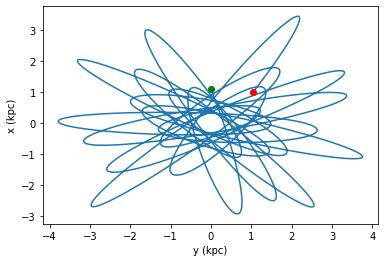

In [44]:
# Plot di bidang X-Y
plt.plot(X, Y)
plt.plot(X[0], Y[0], 'go')
plt.plot(X[len(X) - 1], Y[len(Y) - 1], 'ro')
plt.xlabel('y (kpc)')
plt.ylabel('x (kpc)')
plt.show()

In [75]:
#Bintang halo, pilih nilai z yang besar
h1=r[r['Z']>2000]
h1

DESIGNATION,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,l,b,pmra,pmra_error,pmdec,pmdec_error,radial_velocity,radial_velocity_error,d,ra_1,dec_1,X,Y,Z,U,V,W,U_lsr,V_lsr,W_lsr,dU,dV,dW,fD,fTD,fH,TD/D,TD/H
,,deg,mas,deg,mas,mas,mas,,deg,deg,mas / yr,mas / yr,mas / yr,mas / yr,km / s,km / s,,,,pc,pc,pc,km / s,km / s,km / s,km / s,km / s,km / s,,,,,,,km / s,km / s
object,int64,float64,float32,float64,float32,float64,float32,float32,float64,float64,float64,float32,float64,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
Gaia DR3 2268487449553925120,2268487449553925120,280.64468227152366,0.0111755375,75.2545222110858,0.014099062,0.1492438051502867,0.012630577,11.8160715,106.38764400070139,26.725763918108942,0.8988711846609696,0.014540627,-0.019777067584531023,0.016117731,-88.25216,1.3649198,6700.445616439571,4.898173733851447,1.3134391895986504,-9802.721875384439,5741.502293603169,3038.4493036843937,29.418661052070412,181.69841413570978,-57.39456343412633,27.085515393788164,-49.10158586429026,-57.83204631996299,0.7231840823486102,1.005681147181944,0.6644247481113518,1.2866198948535629e-09,1.6711097857269583e-08,9.713183592197099e-12,12.98837203133064,1720.455265634444
Gaia DR3 4126125225291056128,4126125225291056128,255.03317139744496,0.021487199,-21.805458918296907,0.013048038,0.08980820026100339,0.0236994,3.7894716,0.1785136082674179,12.494001858595638,-6.4352952485095445,0.027959183,-3.7164574963162624,0.01926704,-57.18993,3.4088387,11134.840661473772,4.451168542688443,-0.3805770530326422,2755.256694164572,33.85814084476306,2401.849432141188,-75.585042865832,-113.81165882509003,149.66719334502284,-78.44811808397611,-344.6116588250901,148.96012268536208,36.39434271305833,59.54024266164415,64.4215336727081,6.547470554419368e-85,1.6318034500401313e-25,6.351579796214499e-12,2.4922654275072794e+59,2.569130047004488e-14
Gaia DR3 5902635234952919424,5902635234952919424,229.41556966531132,0.016261697,-48.58771270035186,0.0147440415,0.05240863081209193,0.02160732,2.4255035,326.34763674082217,7.522526614995877,-5.6713546432146025,0.024810676,-4.38955520096602,0.021269761,-47.847637,1.46229,19080.82665974315,4.004057045998108,-0.848015562634205,7630.830165650369,-10482.702296775851,2478.45731250424,-377.9516707365681,-270.1235410075173,-58.19308699671689,-380.28143555987157,-500.9235410075173,-59.673820514593075,135.14034212776875,125.32788991748897,138.77469881894393,7.406037702330672e-163,1.2717219591439357e-46,2.6818434889023206e-14,1.717142161919762e+116,4.741969337160879e-33
Gaia DR3 4128850094288498304,4128850094288498304,255.18189743451595,0.025369167,-19.54792151774817,0.01603803,0.1081356747107585,0.028540278,3.7888796,2.1370362641769973,13.709443642375355,-5.202063921607485,0.033488974,-3.1265913952691053,0.024746098,-12.29974,6.074183,9247.64193384655,4.453764301718774,-0.3411755924061527,861.5359927462459,335.00638493617134,2189.4889260127643,-14.505945318318922,-0.13316760733282978,106.81686689250785,-17.2594834745327,-230.93316760733288,106.2663569936625,25.170514626235274,41.358931454584294,44.558750432820005,5.806049427229847e-41,4.939027521522975e-15,3.612030211729427e-11,8.50669217240794e+25,0.0001367382671796144
Gaia DR3 4128852705629418368,4128852705629418368,255.62208185606562,0.020953747,-19.67598891645497,0.013540045,0.1009646574373822,0.021813298,4.628583,2.278847325211261,13.29795798102662,-3.001774435445459,0.027076062,-1.3279234588867457,0.019698346,43.452957,7.755363,9904.455929246284,4.461446969190803,-0.3434107901780507,1515.0920093807117,383.2588899528582,2274.315215376844,42.65602543160358,113.93170991183544,93.90330553522347,39.935370756218845,-116.8682900881646,93.4992266792016,12.264854143291306,18.394950801049855,20.10998136725579,2.3784731820765595e-19,2.9563356608084894e-10,2.1537261158145307e-11,1242955221.4784355,13.726609150070203
G

In [76]:
#Bintang halo (Gaia DR3 2268487449553925120)
x = -9.802721875384439 * u.kpc
y = 5.741502293603169 * u.kpc
z = 3.0384493036843937 * u.kpc
U = 27.085515393788164 * u.kilometer / (u.second)
V = -49.10158586429026 * u.kilometer / (u.second)
W = -57.83204631996299 * u.kilometer / (u.second)
Ax = 0 * u.kilometer / (u.s)**2
Ay = 0 * u.kilometer / (u.s)**2
Az = 0 * u.kilometer / (u.s)**2
X, Y, Z = [x.value], [y.value], [z.value]
R = [np.sqrt(x.value**2 + y.value**2)]

dt = 2E4 * u.yr                                            # Timestep of the simulation
t = 0 * u.yr                                                 # Set t0 = 0

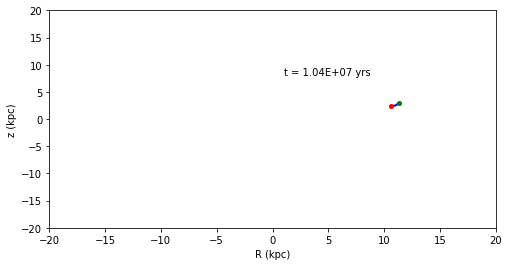

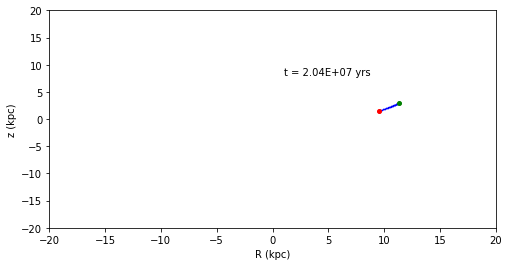

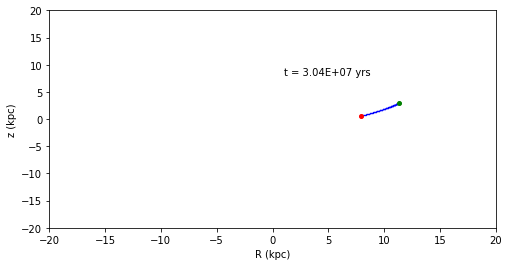

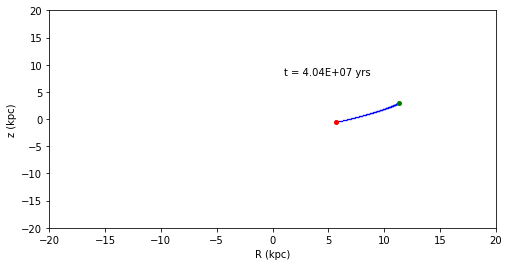

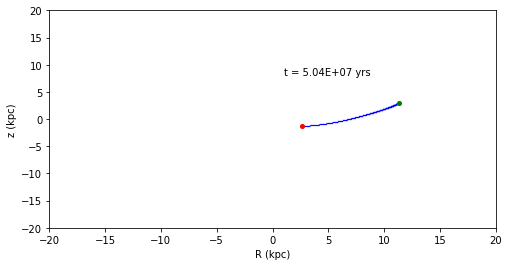

...

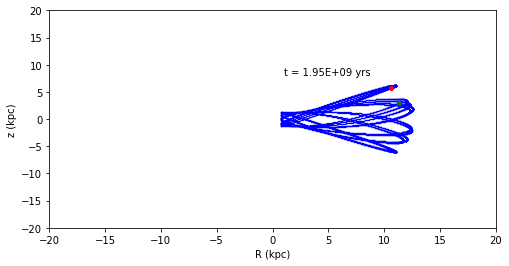

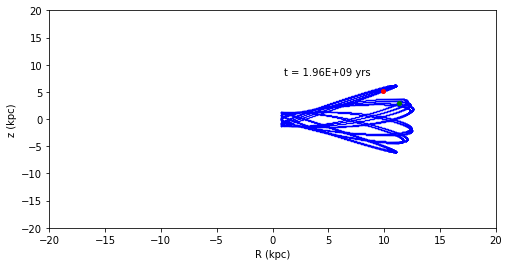

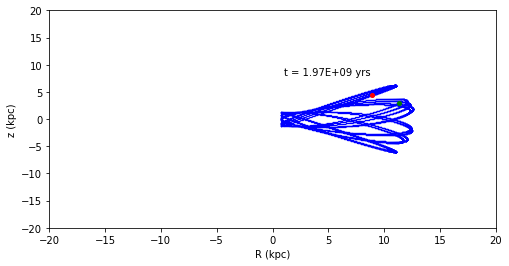

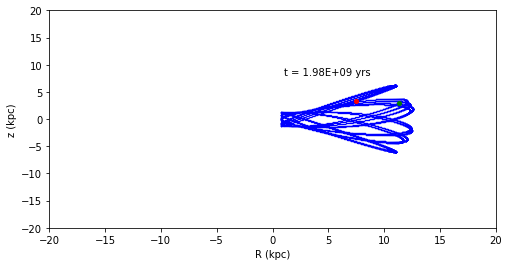

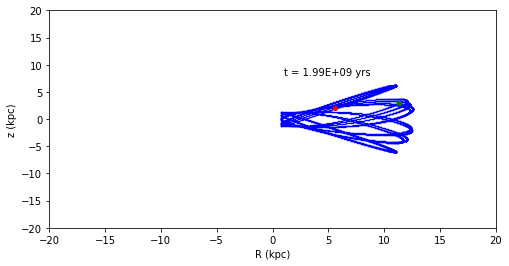

CPU times: total: 20min 44s
Wall time: 7h 20min 22s


In [78]:
%%time
# The simulation uses second order approximation of gradient
# This implies the simulation will result large error for large dt 
# Result also may deviates at large enough t
# Another note: at dt constant, typically error increase as U, V, W increase
#               choose smaller dt for larger U, V, W

# WARNING
# Long simulation ahead, this'll take quite some time

count = 0
while t.value <= 2E9:                                        # We do the simulation for 2 Gyr
    dx = (U*dt).decompose() + (0.5*Ax*dt**2).decompose()
    dy = (V*dt).decompose() + (0.5*Ay*dt**2).decompose()
    dz = (W*dt).decompose() + (0.5*Az*dt**2).decompose()
    Ax = -((((totpot(x + dx/2, y, z)) - (totpot(x - dx/2, y, z))) / dx) + ((totpot(x + dx/2, y, z) - 2*totpot(x, y, z) + totpot(x - dx/2, y, z))/ dx)).decompose()
    Ay = -((((totpot(x, y + dy/2, z)) - (totpot(x, y - dy/2, z))) / dy) + ((totpot(x, y + dy/2, z) - 2*totpot(x, y, z) + totpot(x, y - dy/2, z))/ dy)).decompose()
    Az = -((((totpot(x, y, z + dz/2)) - (totpot(x, y, z - dz/2))) / dz) + ((totpot(x, y, z + dz/2) - 2*totpot(x, y, z) + totpot(x, y, z - dz/2))/ dz)).decompose()
    U += (Ax*dt).decompose()
    V += (Ay*dt).decompose()
    W += (Az*dt).decompose()
    x += dx.decompose()
    y += dy.decompose()
    z += dz.decompose()
    X.append(x.value)
    Y.append(y.value)
    Z.append(z.value)
    R.append(np.sqrt(x.value**2 + y.value**2))
    t += dt
    count += 1

    if count%500 == 0:                                        # Plotting frequency
        fig, ax = plt.subplots(figsize=(8, 4))
        plt.plot(R, Z, 'bo', markersize=.1, alpha=.5)
        plt.plot(np.sqrt(x.value**2 + y.value**2), z.value, 'ro', markersize=4)
        plt.plot(R[0], Z[0], 'go', markersize=4)
        plt.text(1, 8.1, 't = ' + str('%.2E' % Decimal(t.value)) + ' yrs')
        plt.xlim(-20, 20)
        plt.ylim(-20, 20)
        plt.xlabel('R (kpc)')
        plt.ylabel('z (kpc)')
        plt.show()

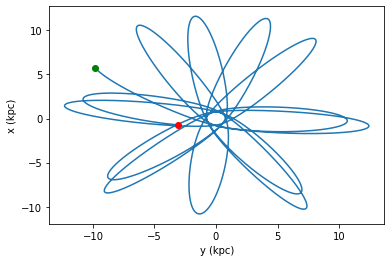

In [79]:
# Plotting on XY plane
plt.plot(X, Y)
plt.plot(X[0], Y[0], 'go')
plt.plot(X[len(X) - 1], Y[len(Y) - 1], 'ro')
plt.xlabel('y (kpc)')
plt.ylabel('x (kpc)')
plt.show()